# INTRODUCTION

### Contexte
* Le principal objectif de ce projet est de masquer les régions d'utilisation des terres dans les images satellites obtenues par Landsat. Ces images ont une faible résolution spatiale, ce qui signifie que chaque pixel couvre une grande surface de terrain. Le masquage permet d'identifier et d'isoler les différentes zones d'utilisation des terres pour des analyses plus précises.

### Contenu
* **Jeu de données** : Ce jeu de données contient des images satellites classées en 21 catégories différentes. Ces catégories incluent des bâtiments, des terrains de baseball, des autoroutes, et d'autres types d'utilisation des terres. 

* **Taille des images** : Les images originales ont une taille de 256x256 pixels. Cela signifie que chaque image est composée de 256 pixels en largeur et 256 pixels en hauteur, formant un carré de pixels.

* **Robustesse du modèle** : En augmentant le nombre d'images, le modèle d'apprentissage automatique formé sur ce jeu de données devient plus robuste. Cela signifie qu'il est plus résistant aux variations et aux anomalies dans les données, et qu'il peut mieux généraliser ses prédictions à de nouvelles images qui n'ont pas été vues pendant l'entraînement.

### Remerciements
* **Source des données** : Les images utilisées dans ce projet proviennent du jeu de données UC Merced. 

* **Référence académique** : Le jeu de données a été introduit par Yi Yang et Shawn Newsam dans leur article intitulé "Bag-Of-Visual-Words and Spatial Extensions for Land-Use Classification," présenté lors de la Conférence internationale ACM SIGSPATIAL sur les avancées en systèmes d'information géographique (ACM GIS) en 2010. Cet article explique l'utilisation de la méthode "Bag-Of-Visual-Words" et ses extensions spatiales pour la classification de l'utilisation des terres à partir d'images satellites.

# PACKAGES ET LIBRAIRIES

In [2]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
#SCALER & TRANSFORMATION
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from keras import regularizers



from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
#SKLEARN CLASSIFIER
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

2024-05-20 05:51:09.219573: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 05:51:09.219691: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 05:51:09.344915: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# PREPARTION DE DONNEES

In [3]:
Train_Data_Path = Path("../input/landuse-scene-classification/images_train_test_val/train")
Test_Data_Path = Path("../input/landuse-scene-classification/images_train_test_val/test")
Validation_Data_Path = Path("../input/landuse-scene-classification/images_train_test_val/validation")

In [4]:
Train_PNG_Path = list(Train_Data_Path.glob(r"*/*.png"))
Test_PNG_Path = list(Test_Data_Path.glob(r"*/*.png"))
Validation_PNG_Path = list(Validation_Data_Path.glob(r"*/*.png"))

In [5]:
Train_PNG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Train_PNG_Path))
Test_PNG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Test_PNG_Path))
Validation_PNG_Labels = list(map(lambda x : os.path.split(os.path.split(x)[0])[1],Validation_PNG_Path))

In [6]:
Labels_List = ["agricultural","agricultural","airplane","baseballdiamond","beach",
 "buildings","chaparral","denseresidential","forest","freeway","golfcourse","harbor",
 "intersection","mediumresidential","mobilehomepark","overpass",
 "parkinglot","river","runway","sparseresidential","storagetanks","tenniscourt"]

In [7]:
for labels in Labels_List:
    print(f"{labels}: ", Train_PNG_Labels.count(labels))

agricultural:  350
agricultural:  350
airplane:  350
baseballdiamond:  350
beach:  350
buildings:  350
chaparral:  350
denseresidential:  350
forest:  350
freeway:  350
golfcourse:  350
harbor:  350
intersection:  350
mediumresidential:  350
mobilehomepark:  350
overpass:  350
parkinglot:  350
river:  350
runway:  350
sparseresidential:  350
storagetanks:  350
tenniscourt:  350


In [8]:
for labels in Labels_List:
    print(f"{labels}: ", Test_PNG_Labels.count(labels))

agricultural:  50
agricultural:  50
airplane:  50
baseballdiamond:  50
beach:  50
buildings:  50
chaparral:  50
denseresidential:  50
forest:  50
freeway:  50
golfcourse:  50
harbor:  50
intersection:  50
mediumresidential:  50
mobilehomepark:  50
overpass:  50
parkinglot:  50
river:  50
runway:  50
sparseresidential:  50
storagetanks:  50
tenniscourt:  50


In [9]:
for labels in Labels_List:
    print(f"{labels}: ", Validation_PNG_Labels.count(labels))

agricultural:  100
agricultural:  100
airplane:  100
baseballdiamond:  100
beach:  100
buildings:  100
chaparral:  100
denseresidential:  100
forest:  100
freeway:  100
golfcourse:  100
harbor:  100
intersection:  100
mediumresidential:  100
mobilehomepark:  100
overpass:  100
parkinglot:  100
river:  100
runway:  100
sparseresidential:  100
storagetanks:  100
tenniscourt:  100


# Stocker les liens des images et ses categories dans une structure de donnnées

In [10]:
Train_PNG_Path_Series = pd.Series(Train_PNG_Path,name="PNG").astype(str)
Test_PNG_Path_Series = pd.Series(Test_PNG_Path,name="PNG").astype(str)
Validation_PNG_Path_Series = pd.Series(Validation_PNG_Path,name="PNG").astype(str)

In [11]:
print(Train_PNG_Path_Series)
print("---"*20)
print(Test_PNG_Path_Series)
print("---"*20)
print(Validation_PNG_Path_Series)

0       ../input/landuse-scene-classification/images_t...
1       ../input/landuse-scene-classification/images_t...
2       ../input/landuse-scene-classification/images_t...
3       ../input/landuse-scene-classification/images_t...
4       ../input/landuse-scene-classification/images_t...
                              ...                        
7345    ../input/landuse-scene-classification/images_t...
7346    ../input/landuse-scene-classification/images_t...
7347    ../input/landuse-scene-classification/images_t...
7348    ../input/landuse-scene-classification/images_t...
7349    ../input/landuse-scene-classification/images_t...
Name: PNG, Length: 7350, dtype: object
------------------------------------------------------------
0       ../input/landuse-scene-classification/images_t...
1       ../input/landuse-scene-classification/images_t...
2       ../input/landuse-scene-classification/images_t...
3       ../input/landuse-scene-classification/images_t...
4       ../input/landuse-scene

In [12]:
Train_PNG_Labels_Series = pd.Series(Train_PNG_Labels,name="CATEGORY")
Test_PNG_Labels_Series = pd.Series(Test_PNG_Labels,name="CATEGORY")
Validation_PNG_Labels_Series = pd.Series(Validation_PNG_Labels,name="CATEGORY")

In [13]:
print(Train_PNG_Labels_Series)
print("---"*20)
print(Test_PNG_Labels_Series)
print("---"*20)
print(Validation_PNG_Labels_Series)

0           airplane
1           airplane
2           airplane
3           airplane
4           airplane
            ...     
7345    agricultural
7346    agricultural
7347    agricultural
7348    agricultural
7349    agricultural
Name: CATEGORY, Length: 7350, dtype: object
------------------------------------------------------------
0           airplane
1           airplane
2           airplane
3           airplane
4           airplane
            ...     
1045    agricultural
1046    agricultural
1047    agricultural
1048    agricultural
1049    agricultural
Name: CATEGORY, Length: 1050, dtype: object
------------------------------------------------------------
0           airplane
1           airplane
2           airplane
3           airplane
4           airplane
            ...     
2095    agricultural
2096    agricultural
2097    agricultural
2098    agricultural
2099    agricultural
Name: CATEGORY, Length: 2100, dtype: object


# Concatenation des données:

In [14]:
Main_Train_Data = pd.concat([Train_PNG_Path_Series,Train_PNG_Labels_Series],axis=1)
Main_Test_Data = pd.concat([Test_PNG_Path_Series,Test_PNG_Labels_Series],axis=1)
Main_Validation_Data = pd.concat([Validation_PNG_Path_Series,Validation_PNG_Labels_Series],axis=1)

In [15]:
print(Main_Train_Data.head(5))
print("---"*20)
print(Main_Test_Data.head(5))
print("---"*20)
print(Main_Validation_Data.head(5))

                                                 PNG  CATEGORY
0  ../input/landuse-scene-classification/images_t...  airplane
1  ../input/landuse-scene-classification/images_t...  airplane
2  ../input/landuse-scene-classification/images_t...  airplane
3  ../input/landuse-scene-classification/images_t...  airplane
4  ../input/landuse-scene-classification/images_t...  airplane
------------------------------------------------------------
                                                 PNG  CATEGORY
0  ../input/landuse-scene-classification/images_t...  airplane
1  ../input/landuse-scene-classification/images_t...  airplane
2  ../input/landuse-scene-classification/images_t...  airplane
3  ../input/landuse-scene-classification/images_t...  airplane
4  ../input/landuse-scene-classification/images_t...  airplane
------------------------------------------------------------
                                                 PNG  CATEGORY
0  ../input/landuse-scene-classification/images_t...  airpl

In [16]:
print(Main_Train_Data["CATEGORY"].value_counts())

CATEGORY
airplane             350
tenniscourt          350
river                350
denseresidential     350
parkinglot           350
storagetanks         350
overpass             350
sparseresidential    350
mediumresidential    350
intersection         350
baseballdiamond      350
runway               350
chaparral            350
freeway              350
beach                350
buildings            350
harbor               350
mobilehomepark       350
forest               350
golfcourse           350
agricultural         350
Name: count, dtype: int64


#### Melange des donnees d'une maniere aleatoire

Cela peut être particulièrement utile avant de commencer à entraîner le modèle pour s'assurer que les données sont mélangées de manière aléatoire, ce qui peut aider à éviter des biais et à améliorer la robustesse du modèle.

In [18]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)
Main_Test_Data = Main_Test_Data.sample(frac=1).reset_index(drop=True)
Main_Validation_Data = Main_Validation_Data.sample(frac=1).reset_index(drop=True)

In [19]:
print(Main_Train_Data.head(-1))
print("---"*20)
print(Main_Test_Data.head(-1))
print("---"*20)
print(Main_Validation_Data.head(-1))

                                                    PNG           CATEGORY
0     ../input/landuse-scene-classification/images_t...             runway
1     ../input/landuse-scene-classification/images_t...         parkinglot
2     ../input/landuse-scene-classification/images_t...     mobilehomepark
3     ../input/landuse-scene-classification/images_t...          chaparral
4     ../input/landuse-scene-classification/images_t...         parkinglot
...                                                 ...                ...
7344  ../input/landuse-scene-classification/images_t...           overpass
7345  ../input/landuse-scene-classification/images_t...  sparseresidential
7346  ../input/landuse-scene-classification/images_t...          buildings
7347  ../input/landuse-scene-classification/images_t...           overpass
7348  ../input/landuse-scene-classification/images_t...       intersection

[7349 rows x 2 columns]
------------------------------------------------------------
              

# VISUALIZATION

In [20]:
plt.style.use("dark_background")

Nous allons dans cette section visualiser les donnees des images pour prendre une idee sur leurs types et carcateristiques.

Text(0.5, 1.0, 'denseresidential')

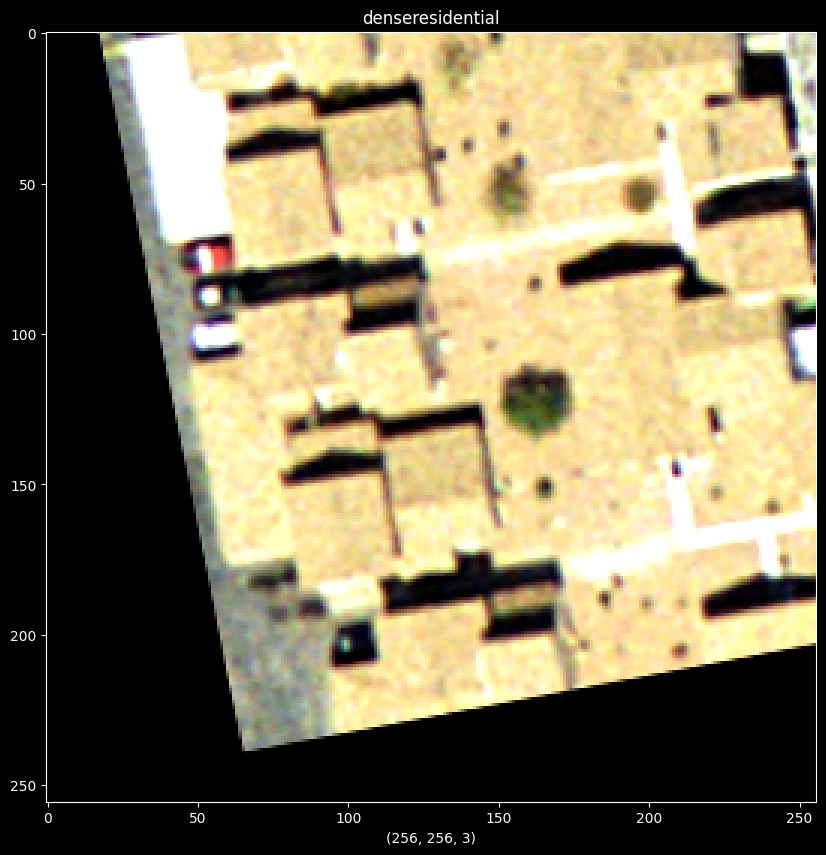

In [19]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["PNG"][20])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][20])

Text(0.5, 1.0, 'mediumresidential')

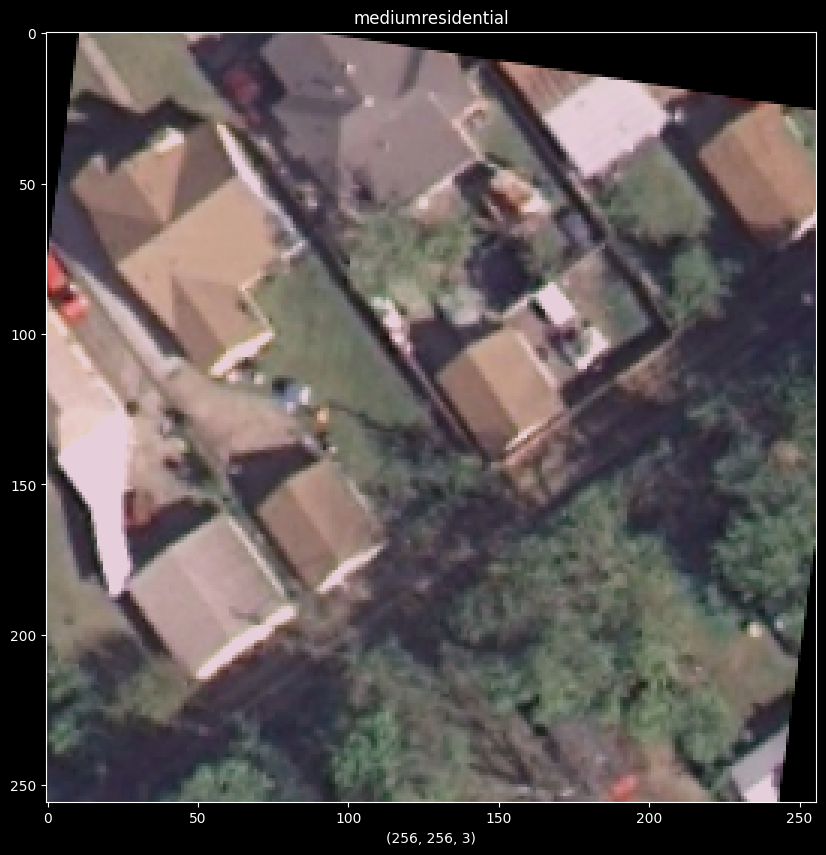

In [20]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["PNG"][55])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][55])

Text(0.5, 1.0, 'mediumresidential')

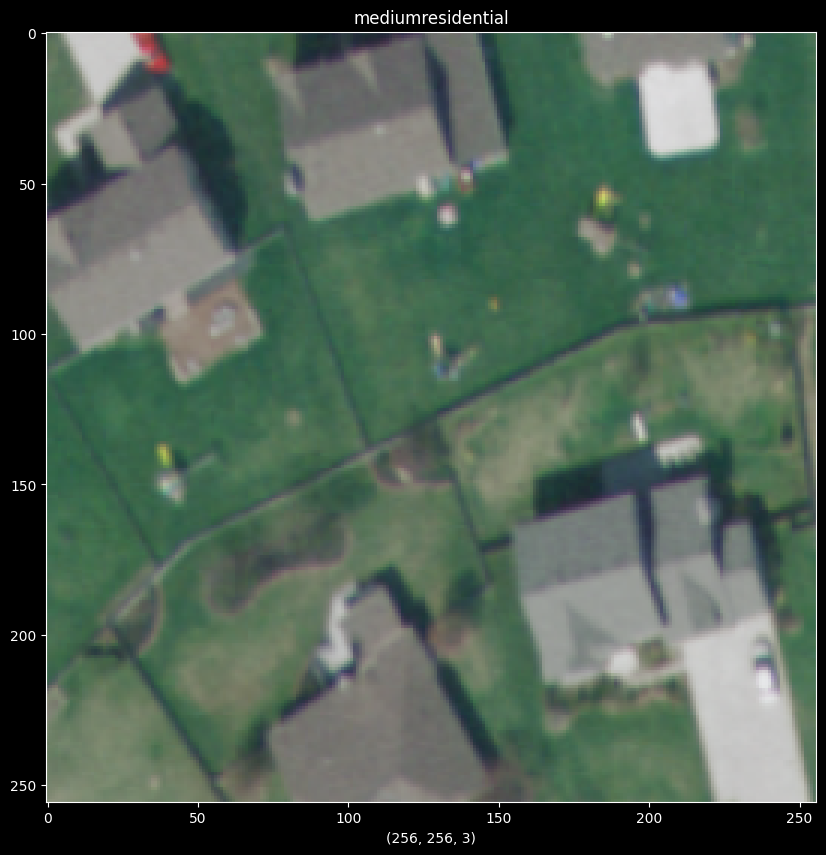

In [21]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["PNG"][1405])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][1405])

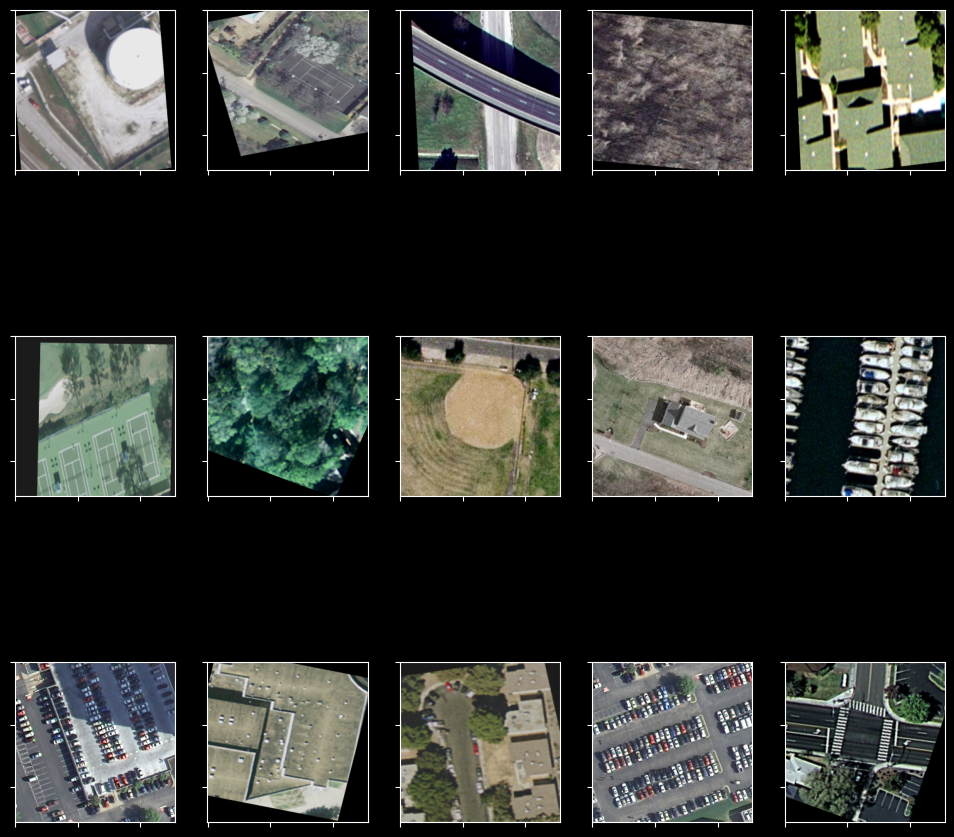

In [22]:
rows = 3
cols = 5

figure,axis = plt.subplots(rows,cols,figsize=(12,12))

for i in range(0,rows):
    for j in range(0,cols):
        axis[i,j].xaxis.set_ticklabels([])
        axis[i,j].yaxis.set_ticklabels([])
        axis[i,j].imshow(plt.imread(Main_Train_Data["PNG"][np.random.randint(1000)]))
plt.show()

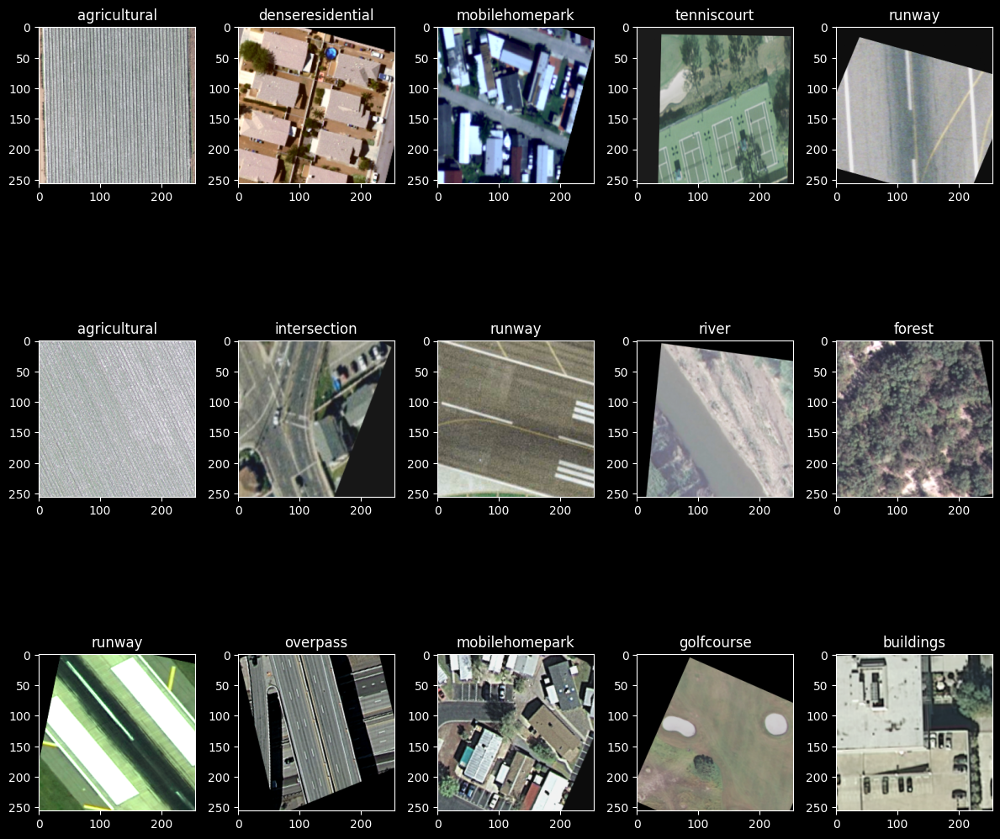

In [23]:
rows = 3
cols = 5

figure,axis = plt.subplots(rows,cols,figsize=(12,12))

for i,ax in enumerate(axis.flat):
    ax.imshow(plt.imread(Main_Train_Data["PNG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

**Pretraitement des images:**
- Reduir le bruit de l'image en utilisant GaussianBlur.
- Conversion des images en niveaux de gris.
- Detection de contours: en utilsant Canny.
- Renforcer les contours dans l'image. avec addWeighted()

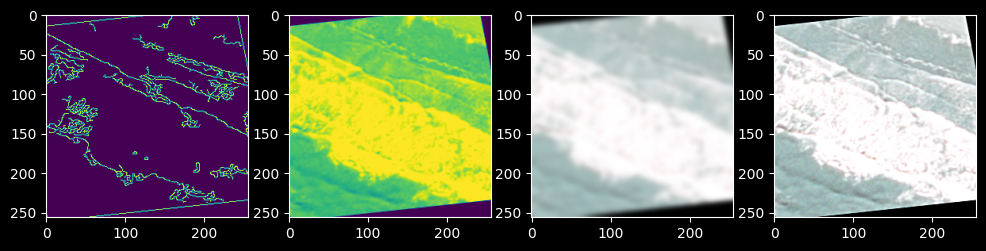

In [22]:
figure,axis = plt.subplots(1,4,figsize=(12,12))

image = Main_Train_Data["PNG"][30]
image = cv2.imread(image)
image_blurred = cv2.GaussianBlur(image, (0, 0), 3)
image_color = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
image_edges = cv2.Canny(image_color,30,200)
image_sharp = cv2.addWeighted(image, 1.5, image_blurred, -0.5, 0)
axis[0].imshow(image_edges)
axis[1].imshow(image_color)
axis[2].imshow(image_blurred)
axis[3].imshow(image_sharp)


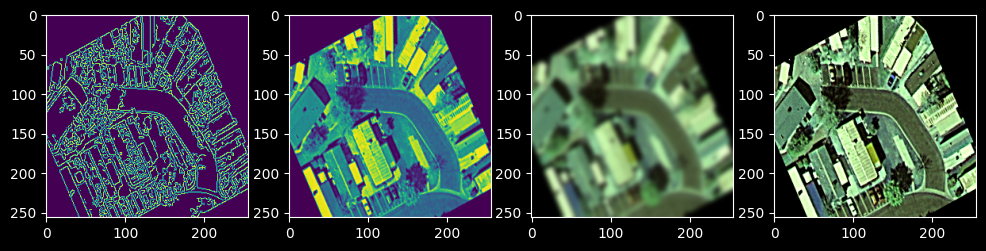

In [23]:
figure,axis = plt.subplots(1,4,figsize=(12,12))

image_Two = Main_Train_Data["PNG"][2005]
image_Two = cv2.imread(image_Two)
image_blurred_Two = cv2.GaussianBlur(image_Two, (0, 0), 3)
image_color_Two = cv2.cvtColor(image_Two,cv2.COLOR_RGB2GRAY)
image_edges_Two = cv2.Canny(image_color_Two,30,200)
image_sharp_Two = cv2.addWeighted(image_Two, 1.5, image_blurred_Two, -0.5, 0)
axis[0].imshow(image_edges_Two)
axis[1].imshow(image_color_Two)
axis[2].imshow(image_blurred_Two)
axis[3].imshow(image_sharp_Two)

**Detection de contours:**
On detecte les contoures de chaque image après on les dessines sur les images réeles.

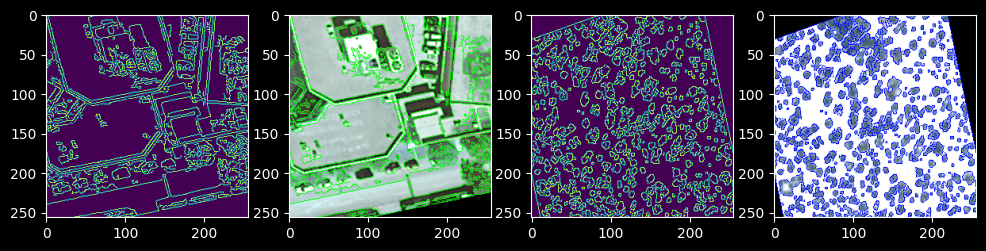

In [24]:
figure,axis = plt.subplots(1,4,figsize=(12,12))

image_Three = Main_Train_Data["PNG"][300]
image_Four = Main_Train_Data["PNG"][1255]

image_Three = cv2.imread(image_Three)
image_Four = cv2.imread(image_Four)

image_edges_Three = cv2.Canny(image_Three,30,200)
image_edges_Four = cv2.Canny(image_Four,30,200)

contours, _ = cv2.findContours(image_edges_Three,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

contours_Two, _ = cv2.findContours(image_edges_Four,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(image_Three, contours, -1, (0, 255, 0), 1)

cv2.drawContours(image_Four, contours_Two, -1, (0, 0, 255), 1)

axis[0].imshow(image_edges_Three)
axis[1].imshow(image_Three)
axis[2].imshow(image_edges_Four)
axis[3].imshow(image_Four)

**Processus de seuillage binaire inversé:**

Ici nous voulons detecter les objets, dans le contexte du seuillage binaire inversé, les pixels dont les valeurs sont comprises entre 0 et 127 (intervalle fermé) seront affectés à la valeur maximale après seuillage cad 255, et les pixels dont les valeurs sont supérieures à 127 seront affectés à la valeur minimale après seuillage, cad 0. Cela signifie que ces pixels seront considérés comme faisant partie de l'arrière-plan dans l'image seuillée.
Notre objective est de detcter les zones d'ombres.

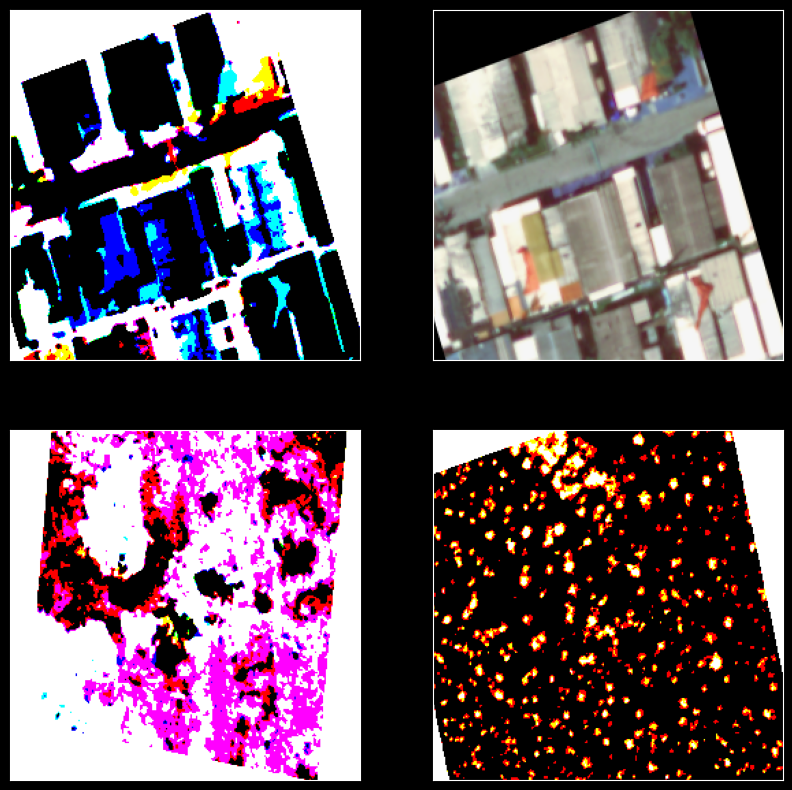

In [30]:
image_Three = Main_Train_Data["PNG"][100]
image_Four = Main_Train_Data["PNG"][1255]
image_Two = Main_Train_Data["PNG"][2005]
image = Main_Train_Data["PNG"][40]

image = cv2.imread(image)
image_Two = cv2.imread(image_Two)
image_Three = cv2.imread(image_Three)
image_Four = cv2.imread(image_Four)

list_image = [image,image_Two,image_Three,image_Four]

ret,thresh = cv2.threshold(image,127,255,cv2.THRESH_BINARY_INV)
ret,thresh_Two = cv2.threshold(image_Two,127,255,cv2.THRESH_BINARY_INV)
ret,thresh_Three = cv2.threshold(image_Three,127,255,cv2.THRESH_BINARY_INV)
ret,thresh_Four = cv2.threshold(image_Four,127,255,cv2.THRESH_BINARY_INV)

thresh_list = [thresh,thresh_Two,thresh_Three,thresh_Four]

fig, axes = plt.subplots(nrows=2,
                         ncols=2,
                         figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})


axes[0,0].imshow(thresh_list[0])
axes[0,1].imshow(image)
axes[1,0].imshow(thresh_list[2])
axes[1,1].imshow(thresh_list[3])

**Processus de seuillage adaptif**

Le processus de seuillage adaptatif est une technique utilisée en traitement d'image pour binariser une image,c'est-à-dire convertir une image en niveaux de gris en une image binaire (noir et blanc).
le seuillage adaptatif utilise des seuils qui varient localement, ce qui le rend plus efficace pour traiter des images avec des variations d'éclairage.

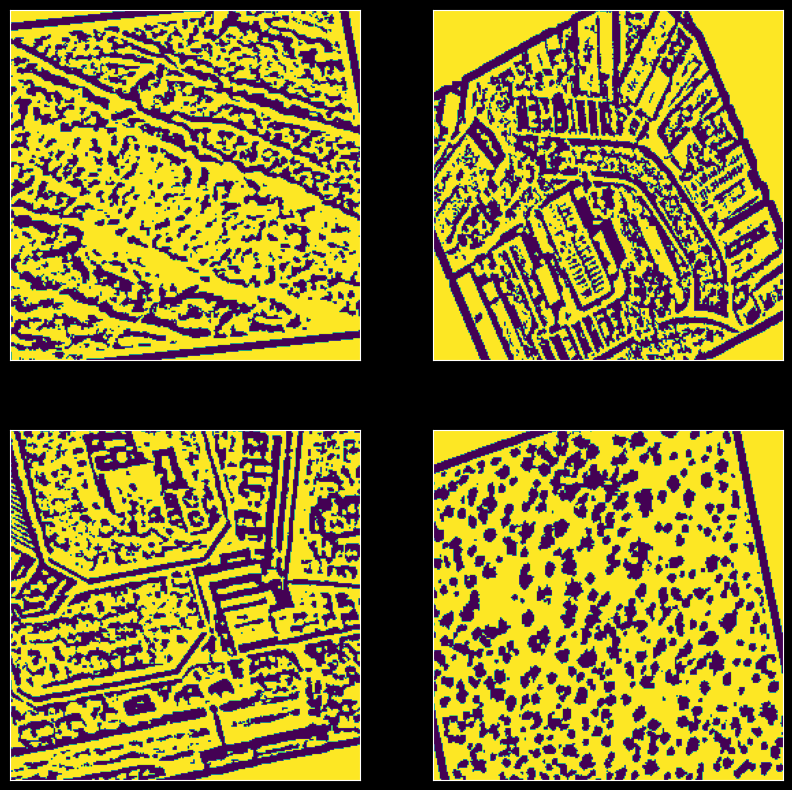

In [31]:
image_Three = Main_Train_Data["PNG"][300]
image_Four = Main_Train_Data["PNG"][1255]
image_Two = Main_Train_Data["PNG"][2005]
image = Main_Train_Data["PNG"][30]

image = cv2.imread(image,0)
image_Two = cv2.imread(image_Two,0)
image_Three = cv2.imread(image_Three,0)
image_Four = cv2.imread(image_Four,0)

list_image = [image,image_Two,image_Three,image_Four]

thresh = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
thresh_Two = cv2.adaptiveThreshold(image_Two,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
thresh_Three = cv2.adaptiveThreshold(image_Three,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
thresh_Four = cv2.adaptiveThreshold(image_Four,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)

thresh_list = [thresh,thresh_Two,thresh_Three,thresh_Four]


fig, axes = plt.subplots(nrows=2,
                         ncols=2,
                         figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

axes[0,0].imshow(thresh_list[0])
axes[0,1].imshow(thresh_list[1])
axes[1,0].imshow(thresh_list[2])
axes[1,1].imshow(thresh_list[3])

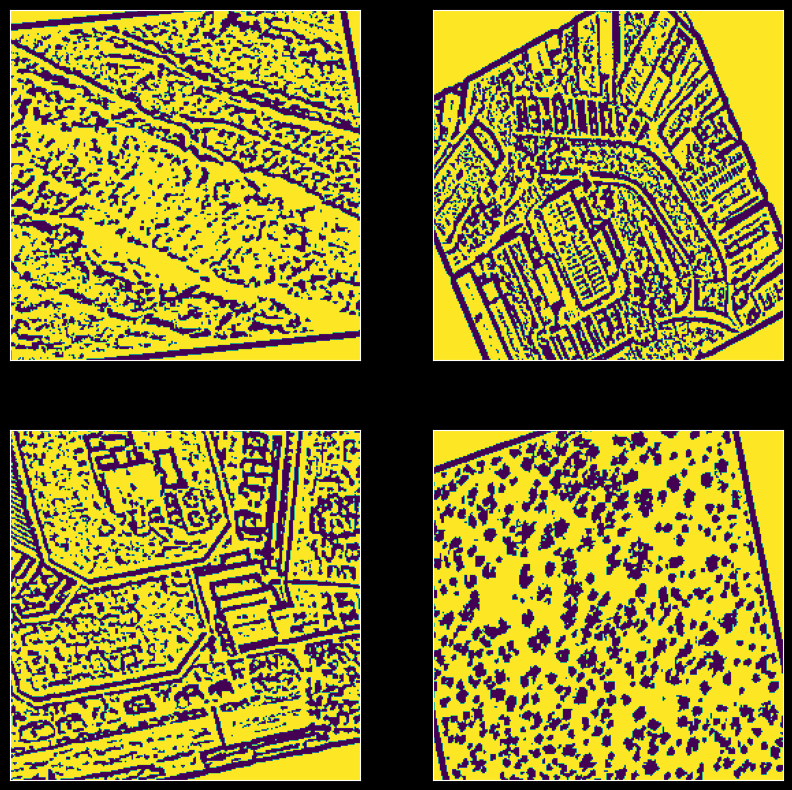

In [32]:
image_Three = Main_Train_Data["PNG"][300]
image_Four = Main_Train_Data["PNG"][1255]
image_Two = Main_Train_Data["PNG"][2005]
image = Main_Train_Data["PNG"][30]

image = cv2.imread(image,0)
image_Two = cv2.imread(image_Two,0)
image_Three = cv2.imread(image_Three,0)
image_Four = cv2.imread(image_Four,0)

list_image = [image,image_Two,image_Three,image_Four]

thresh = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
thresh_Two = cv2.adaptiveThreshold(image_Two,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
thresh_Three = cv2.adaptiveThreshold(image_Three,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
thresh_Four = cv2.adaptiveThreshold(image_Four,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

thresh_list = [thresh,thresh_Two,thresh_Three,thresh_Four]


fig, axes = plt.subplots(nrows=2,
                         ncols=2,
                         figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

axes[0,0].imshow(thresh_list[0])
axes[0,1].imshow(thresh_list[1])
axes[1,0].imshow(thresh_list[2])
axes[1,1].imshow(thresh_list[3])

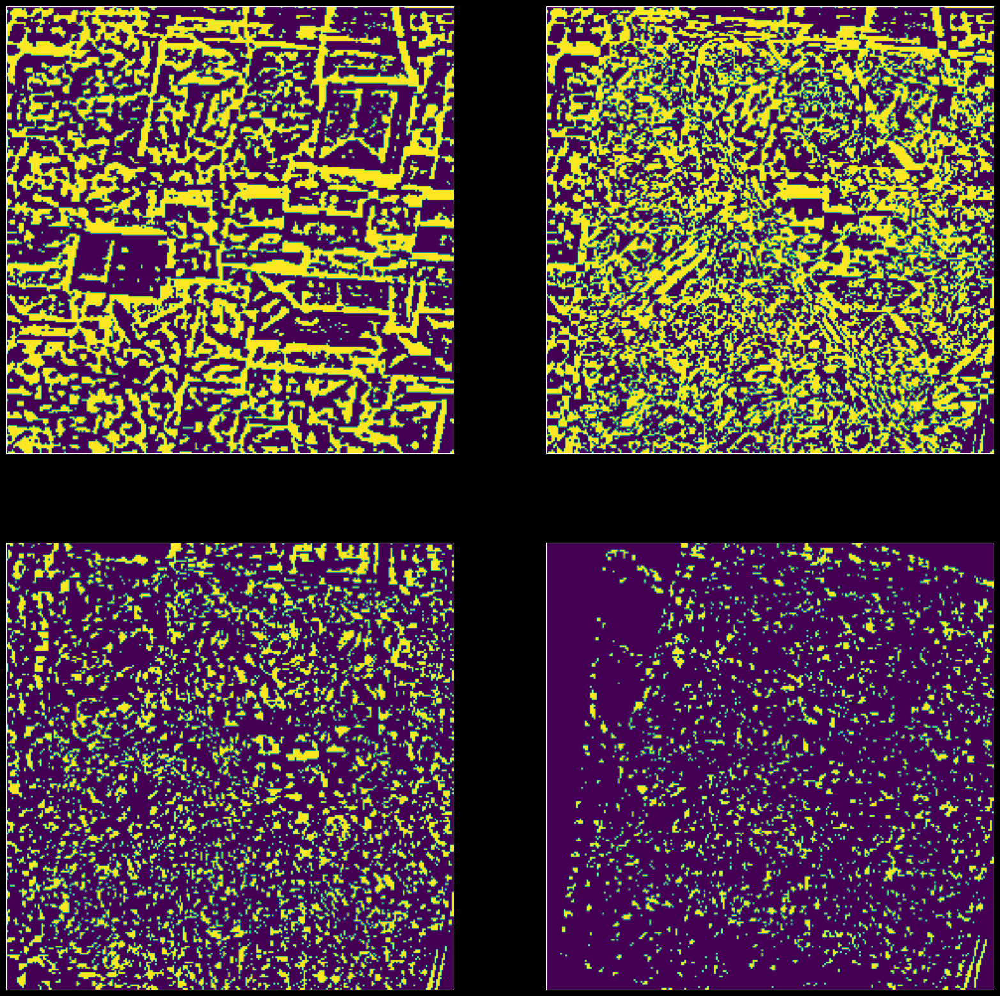

In [30]:
Back_Subt = cv2.createBackgroundSubtractorMOG2()

Back_Mask = Back_Subt.apply(thresh)
Back_Mask_Two = Back_Subt.apply(thresh_Two)
Back_Mask_Three = Back_Subt.apply(thresh_Three)
Back_Mask_Four = Back_Subt.apply(thresh_Four)

fig, axes = plt.subplots(nrows=2,
                         ncols=2,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

axes[0,0].imshow(Back_Mask)
axes[0,1].imshow(Back_Mask_Two)
axes[1,0].imshow(Back_Mask_Three)
axes[1,1].imshow(Back_Mask_Four)

# MODELING PROCESS

Nous allons decider a utiliser un processus de seuillage adptif qui est basé sur une fenetre gaussienne et soustracter le fond de l'image avec **createBackgroundSubtractorMOG2** pour detecter les objets en mouvement.

In [31]:
Back_Subt = cv2.createBackgroundSubtractorMOG2()
New_PNG_List = []
img_size= (160, 160)

for im in Main_Train_Data["PNG"].values:
    Read_IMG_New = cv2.imread(im,0)
    Thresh_IMG = cv2.adaptiveThreshold(Read_IMG_New,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
    Mask_IMG = Back_Subt.apply(Thresh_IMG)
    Mask_IMG = cv2.resize(Mask_IMG,img_size,interpolation=cv2.INTER_AREA)
    New_PNG_List.append(Mask_IMG/255.0)

In [32]:
New_PNG_List = np.stack(New_PNG_List)

In [33]:
print(type(New_PNG_List))

<class 'numpy.ndarray'>


In [34]:
print(New_PNG_List.shape)

(7350, 160, 160)


In [35]:
print(New_PNG_List[5].shape)

(160, 160)


In [36]:
encode = LabelEncoder()
Main_Train_Data["CATEGORY"] = encode.fit_transform(Main_Train_Data["CATEGORY"])

In [37]:
New_Labels_List = []
for label in Main_Train_Data["CATEGORY"].values:
    New_Labels_List.append(label)

In [38]:
New_Labels_List = np.asarray(New_Labels_List)

In [39]:
print(type(New_Labels_List))

<class 'numpy.ndarray'>


In [40]:
print(New_Labels_List.shape)

(7350,)


In [41]:
print(New_Labels_List[777])

12


In [42]:
New_PNG_List

array([[[0.68627451, 0.62352941, 0.74901961, ..., 0.49803922,
         0.57647059, 0.81176471],
        [0.68627451, 0.86666667, 0.9372549 , ..., 0.56078431,
         0.56078431, 0.75686275],
        [0.68627451, 0.65490196, 0.8745098 , ..., 1.        ,
         1.        , 1.        ],
        ...,
        [0.68627451, 1.        , 0.74901961, ..., 0.62352941,
         0.49803922, 0.65490196],
        [0.63921569, 0.96862745, 0.74901961, ..., 0.68627451,
         0.57647059, 0.57647059],
        [0.49803922, 0.8745098 , 0.74901961, ..., 0.65490196,
         0.65490196, 0.81176471]],

       [[0.62352941, 0.        , 0.50196078, ..., 0.        ,
         0.15686275, 0.62352941],
        [0.90588235, 0.67058824, 0.8745098 , ..., 0.1254902 ,
         0.1254902 , 0.51372549],
        [1.        , 0.31372549, 0.50196078, ..., 1.        ,
         1.        , 1.        ],
        ...,
        [0.68627451, 1.        , 0.74901961, ..., 0.25098039,
         0.        , 0.31372549],
        [0.3

In [43]:
New_Labels_List

array([ 0,  6, 13, ...,  5,  7,  6])

Divison de donnes:

In [44]:
xTrain,xTest,yTrain,yTest = train_test_split(New_PNG_List,New_Labels_List,
                                             train_size=0.8,
                                             shuffle=True,
                                             random_state=42)

In [45]:
print(xTrain.shape)

(5880, 160, 160)


Transformation de shape pour etre compatible avec le modéle

In [46]:
sample_shape = xTrain[0].shape
img_width, img_height = sample_shape[0], sample_shape[1]
input_shape = (img_width, img_height, 1)

In [47]:
xTrain = xTrain.reshape(len(xTrain),input_shape[0],input_shape[1],input_shape[2])

In [48]:
print(xTrain.shape)

(5880, 160, 160, 1)


In [49]:
print(yTrain.shape)

(5880,)


In [50]:
yTrain = to_categorical(yTrain)

In [51]:
yTrain

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [52]:
xTest = xTest.reshape(len(xTest),input_shape[0],input_shape[1],input_shape[2])

In [53]:
print(xTest.shape)

(1470, 160, 160, 1)


In [54]:
print(yTest.shape)

(1470,)


In [55]:
yTest = to_categorical(yTest)

In [56]:
yTest

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

Normalisation des données

In [57]:
xTrain = xTrain / 255

In [58]:
xTest = xTest / 255

#### MODEL I

In [59]:
model = Sequential()
model.add(Conv2D(64, (3,3), activation='relu',input_shape=(160,160,1)))
model.add(Conv2D(64, (3,3), activation='relu'))

model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Conv2D(128, (3,3), activation='relu',padding="same"))
model.add(Conv2D(128, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Conv2D(256, (3,3), activation='relu',padding="same"))
model.add(Conv2D(256, (3,3), activation='relu',padding="same"))
model.add(Conv2D(256, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Flatten())
model.add(Dense(4096, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(4096, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(21,activation="softmax"))

In [60]:
print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 158, 158, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 156, 156, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 78, 78, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 78, 78, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 78, 78, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 39, 39, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 39, 39, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 39, 39, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 39, 39, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 19, 19, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 19, 19, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 19, 19, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 19, 19, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │    33,558,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 21)             │        86,037 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65,139,413 (248.49 MB)

 Trainable params: 65,139,413 (248.49 MB)

 Non-trainable params: 0 (0.00 B)

None


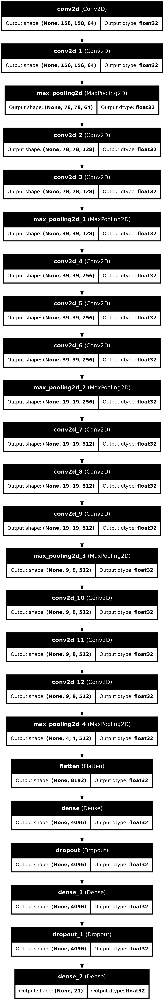

In [61]:
plot_model(model,to_file="Model_One.png",show_layer_names=True,show_dtype=True,show_shapes=True)

#### IMAGE GENERATOR FOR MODEL II

In [62]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    shear_range=0.3,
                                    zoom_range=0.2,
                                    brightness_range=[0.2,0.9],
                                    rotation_range=30,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    fill_mode="nearest",
                                    validation_split=0.1)

In [63]:
Test_Generator = ImageDataGenerator(rescale=1./255,validation_split=0.1)

In [64]:
Train_PNG_Path_Series = pd.Series(Train_PNG_Path,name="PNG").astype(str)
Test_PNG_Path_Series = pd.Series(Test_PNG_Path,name="PNG").astype(str)
Validation_PNG_Path_Series = pd.Series(Validation_PNG_Path,name="PNG").astype(str)
Train_PNG_Labels_Series = pd.Series(Train_PNG_Labels,name="CATEGORY")
Test_PNG_Labels_Series = pd.Series(Test_PNG_Labels,name="CATEGORY")
Validation_PNG_Labels_Series = pd.Series(Validation_PNG_Labels,name="CATEGORY")

In [65]:
Main_Train_Data = pd.concat([Train_PNG_Path_Series,Train_PNG_Labels_Series],axis=1)
Main_Test_Data = pd.concat([Test_PNG_Path_Series,Test_PNG_Labels_Series],axis=1)
Main_Validation_Data = pd.concat([Validation_PNG_Path_Series,Validation_PNG_Labels_Series],axis=1)

In [66]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)
Main_Test_Data = Main_Test_Data.sample(frac=1).reset_index(drop=True)
Main_Validation_Data = Main_Validation_Data.sample(frac=1).reset_index(drop=True)

In [67]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Main_Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="training")

Found 6615 validated image filenames belonging to 21 classes.


In [68]:
Test_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Main_Test_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32)

Found 1050 validated image filenames belonging to 21 classes.


In [69]:
Validation_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Main_Validation_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="validation")

Found 210 validated image filenames belonging to 21 classes.


In [70]:
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 21)


In [71]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 21)


In [72]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 21)


In [73]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'agricultural': 0, 'airplane': 1, 'baseballdiamond': 2, 'beach': 3, 'buildings': 4, 'chaparral': 5, 'denseresidential': 6, 'forest': 7, 'freeway': 8, 'golfcourse': 9, 'harbor': 10, 'intersection': 11, 'mediumresidential': 12, 'mobilehomepark': 13, 'overpass': 14, 'parkinglot': 15, 'river': 16, 'runway': 17, 'sparseresidential': 18, 'storagetanks': 19, 'tenniscourt': 20}
[8, 9, 3, 19, 3]
(256, 256, 3)
------------------------------------------------------------
VALIDATION: 
{'agricultural': 0, 'airplane': 1, 'baseballdiamond': 2, 'beach': 3, 'buildings': 4, 'chaparral': 5, 'denseresidential': 6, 'forest': 7, 'freeway': 8, 'golfcourse': 9, 'harbor': 10, 'intersection': 11, 'mediumresidential': 12, 'mobilehomepark': 13, 'overpass': 14, 'parkinglot': 15, 'river': 16, 'runway': 17, 'sparseresidential': 18, 'storagetanks': 19, 'tenniscourt': 20}
[5, 5, 8, 17, 20]
(256, 256, 3)
------------------------------------------------------------
TEST: 
{'agricultural': 0, 'airplane': 1, 'bas

#### MODEL II

In [74]:
model = Sequential()
model.add(Conv2D(64, (3,3), activation='relu',input_shape=(160,160,1)))
model.add(Conv2D(64, (3,3), activation='relu'))

model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Conv2D(128, (3,3), activation='relu',padding="same"))
model.add(Conv2D(128, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Conv2D(256, (3,3), activation='relu',padding="same"))
model.add(Conv2D(256, (3,3), activation='relu',padding="same"))
model.add(Conv2D(256, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))
model.add(Conv2D(512, (3,3), activation='relu',padding="same"))

model.add(MaxPooling2D((2,2), strides=(2,2)))


model.add(Flatten())
model.add(Dense(4096, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(4096, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(21,activation="softmax"))

In [75]:
Model = Sequential()

Model.add(SeparableConv2D(32,3, activation="relu",input_shape=(226,226,3)))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2)))

#
Model.add(SeparableConv2D(64,3,activation="relu"))
Model.add(SeparableConv2D(128,(3,3),activation="relu"))
Model.add(Dropout(0.5))
Model.add(MaxPooling2D((2)))

#
Model.add(SeparableConv2D(128,3,activation="relu"))
Model.add(SeparableConv2D(128,3,activation="relu"))
Model.add(Dropout(0.5))
Model.add(GlobalAveragePooling2D())


#
Model.add(Flatten())
Model.add(Dense(256,activation="relu"))
Model.add(Dropout(0.5))
Model.add(Dense(21,activation="softmax"))

In [76]:
Call_Back = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=5,mode="min")

In [77]:
Model.compile(optimizer="adam",loss="categorical_crossentropy",metrics=["accuracy"])

CNN_Model = Model.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                      callbacks=Call_Back,
                      epochs=100)

Epoch 1/100
  2/207 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - accuracy: 0.0312 - loss: 3.0447   

I0000 00:00:1716143993.906600     113 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


207/207 ━━━━━━━━━━━━━━━━━━━━ 151s 618ms/step - accuracy: 0.0424 - loss: 3.0448 - val_accuracy: 0.0571 - val_loss: 3.0439
Epoch 2/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 115s 535ms/step - accuracy: 0.0833 - loss: 2.9171 - val_accuracy: 0.0905 - val_loss: 2.8145
Epoch 3/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 115s 535ms/step - accuracy: 0.1118 - loss: 2.7307 - val_accuracy: 0.1095 - val_loss: 2.7278
Epoch 4/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 115s 538ms/step - accuracy: 0.1459 - loss: 2.6234 - val_accuracy: 0.1524 - val_loss: 2.5727
Epoch 5/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 118s 548ms/step - accuracy: 0.1930 - loss: 2.5022 - val_accuracy: 0.2095 - val_loss: 2.4255
Epoch 6/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 114s 534ms/step - accuracy: 0.2338 - loss: 2.3544 - val_accuracy: 0.1857 - val_loss: 2.5539
Epoch 7/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 116s 543ms/step - accuracy: 0.2805 - loss: 2.1745 - val_accuracy: 0.3143 - val_loss: 2.2133
Epoch 8/100
207/207 ━━━━━━━━━━━━━━━━━━━━ 117s 547ms/step - accuracy: 0.3253 - los

In [78]:
print(Model.summary())

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ separable_conv2d                │ (None, 224, 224, 32)   │           155 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_1              │ (None, 110, 110, 64)   │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_2              │ (None, 108, 108, 128)  │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 108, 108, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_3              │ (None, 52, 52, 128)    │        17,664 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_4              │ (None, 50, 50, 128)    │        17,664 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 50, 50, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 21)             │         5,397 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 255,858 (999.45 KB)

 Trainable params: 85,264 (333.06 KB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 170,530 (666.14 KB)

None


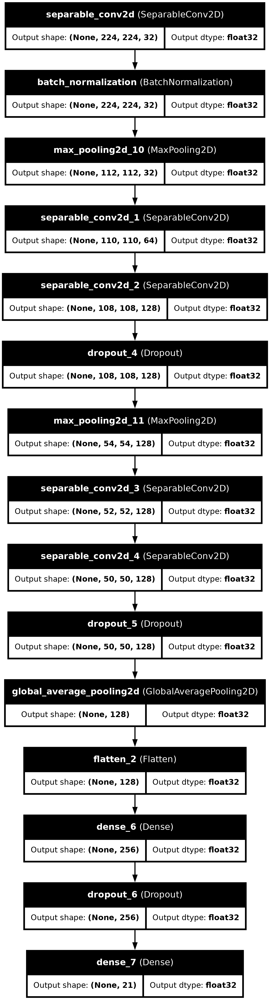

In [79]:
plot_model(Model,to_file="Model_Two.png",show_layer_names=True,show_dtype=True,show_shapes=True)

In [80]:
Model_Results = Model.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

33/33 ━━━━━━━━━━━━━━━━━━━━ 14s 428ms/step - accuracy: 0.7977 - loss: 0.6755
LOSS:  0.6555
ACCURACY:  0.80


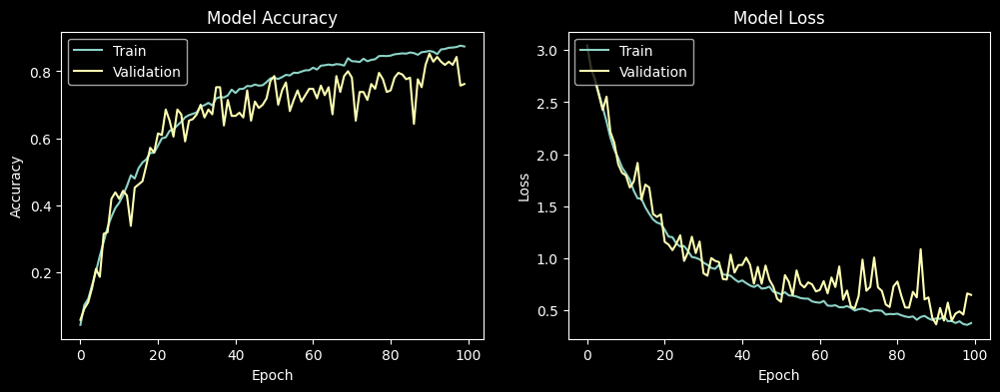

In [86]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(CNN_Model.history['accuracy'])
plt.plot(CNN_Model.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(CNN_Model.history['loss'])
plt.plot(CNN_Model.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [ ]:
y_true

In [85]:
import tensorflow as tf

# Assuming `Model` is your trained CNN model
Model.save('my_cnn_model.h5')
